In [1]:
cd F:\PROJECTS\snRNA-SEQ

F:\PROJECTS\snRNA-SEQ


In [3]:
import sys

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import scanpy as sc
import scvi

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())

import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')
#import scrublet as scr


Global seed set to 0


In [4]:
adata=sc.read("snRNA-P8.h5ad")

In [5]:
adata2=sc.read("scRNA_P8P12P20.h5ad")

In [6]:
adata

AnnData object with n_obs × n_vars = 28822 × 37999
    obs: 'cell_type', 'age', 'louvain'
    var: 'gene_symbol'

In [7]:
adata2

AnnData object with n_obs × n_vars = 88006 × 39970
    obs: 'cell_type', 'age', 'louvain'
    var: 'gene_symbol'

In [8]:
adata.obs.cell_type.cat.categories

Index(['B cells', 'Basal stria', 'Endothelial cells', 'Erythrocytes',
       'Fibrocytes', 'Glial cells', 'Glial precursor cells',
       'Inner hair cells', 'Intermediate stria', 'Macrophages',
       'Marginal stria', 'Mast cells', 'Monocytes', 'NK cells', 'Neutrophils',
       'Osteoblasts', 'Osteocytes', 'Outer hair cells', 'Pericytes',
       'Pre-osteoblasts', 'Reissner membrane', 'Root cells', 'SS1', 'SS2',
       'Scala vestibuli border cells', 'Schwann cells', 'Spindle cells',
       'Supporting cells', 'Tympanic border cells', 'Type I Neurons',
       'Type II Neurons'],
      dtype='object')

In [9]:
adata2.obs.cell_type.cat.categories

Index(['B cells', 'Basal stria', 'Claudius/Inner-Outer sulcus cells',
       'Deiter's cells', 'Endothelial cells', 'Erythrocytes', 'Fibrocytes',
       'Glial cells', 'Glial precursor cells',
       'Inner border-phalangeal/ Hensen cells', 'Inner hair cells',
       'Interdental cells', 'Intermediate stria', 'Macrophages',
       'Marginal stria', 'Mast cells', 'Monocytes', 'NK cells', 'Neutrophils',
       'Osteoblasts', 'Osteocytes', 'Pericytes', 'Pillar cells',
       'Pre-osteoblasts', 'Reissner membrane', 'Root cells', 'SS1', 'SS2',
       'Scala vestibuli border cells', 'Schwann cells', 'Smooth muscle cells',
       'Spindle cells', 'T cells', 'Tympanic border cells', 'Type I Neurons',
       'Type II Neurons'],
      dtype='object')

In [10]:
adata.var.gene_symbol

gene
ENSMUSG00000109644    0610005C13Rik
ENSMUSG00000007777    0610009B22Rik
ENSMUSG00000086714    0610009E02Rik
ENSMUSG00000043644    0610009L18Rik
ENSMUSG00000042208    0610010F05Rik
                          ...      
ENSMUSG00000064618          n-R5s95
ENSMUSG00000064508          n-R5s96
ENSMUSG00000064519          n-R5s97
ENSMUSG00000084498          n-R5s98
ENSMUSG00000104750         n-TStga1
Name: gene_symbol, Length: 37999, dtype: category
Categories (37914, object): ['0610005C13Rik', '0610009B22Rik', '0610009E02Rik', '0610009L18Rik', ..., 'n-R5s213', 'n-R5s216', 'n-R5s219', 'n-TStga1']

In [12]:
adata.obs["cell_type"].value_counts()

cell_type
Supporting cells                7221
SS1                             4250
Schwann cells                   3401
Osteocytes                      2830
Tympanic border cells           2150
Fibrocytes                      1335
Glial cells                     1081
Erythrocytes                     789
Macrophages                      611
Type I Neurons                   561
Pre-osteoblasts                  521
SS2                              499
Osteoblasts                      428
Monocytes                        409
Spindle cells                    348
Endothelial cells                318
Intermediate stria               311
Neutrophils                      247
NK cells                         206
Pericytes                        187
Scala vestibuli border cells     169
Inner hair cells                 165
Outer hair cells                 153
B cells                          140
Root cells                       125
Glial precursor cells            116
Marginal stria              

In [13]:
adata2.obs["cell_type"].value_counts()

cell_type
B cells                                  13414
Erythrocytes                             12858
Intermediate stria                        9236
Tympanic border cells                     7698
Neutrophils                               6360
SS1                                       4701
Osteocytes                                4323
Macrophages                               4223
Schwann cells                             3464
Monocytes                                 2567
Fibrocytes                                1935
Glial cells                               1655
T cells                                   1518
Pre-osteoblasts                           1287
Inner border-phalangeal/ Hensen cells      988
Claudius/Inner-Outer sulcus cells          921
Scala vestibuli border cells               875
NK cells                                   841
SS2                                        746
Root cells                                 734
Marginal stria                             722
Ost

In [14]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.tl.pca(adata,svd_solver='arpack')
sc.pp.neighbors(adata,n_neighbors=50,n_pcs=30,metric="cosine")
sc.tl.umap(adata)
sc.tl.leiden(adata)

In [15]:
sc.pp.normalize_total(adata2)
sc.pp.log1p(adata2)
sc.tl.pca(adata2,svd_solver='arpack')
sc.pp.neighbors(adata2,n_neighbors=50,n_pcs=30,metric="cosine")
sc.tl.umap(adata2)
sc.tl.leiden(adata2)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


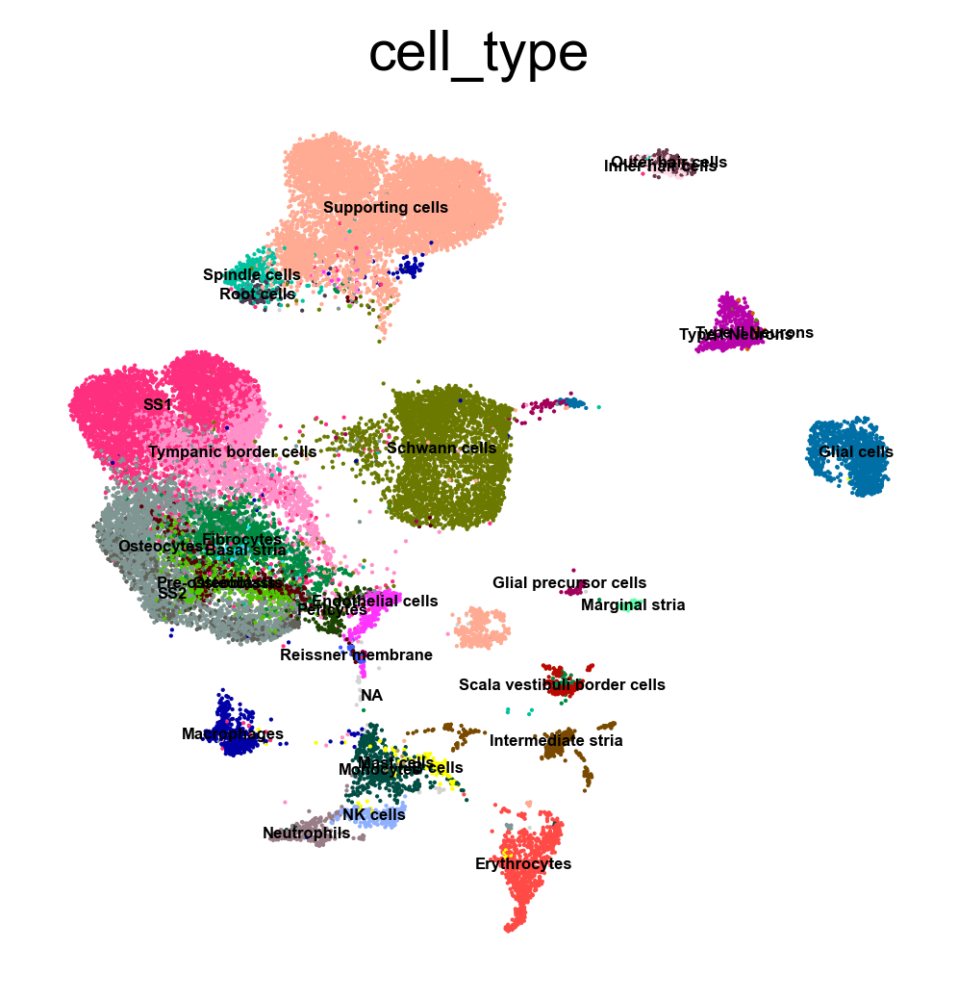

In [16]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


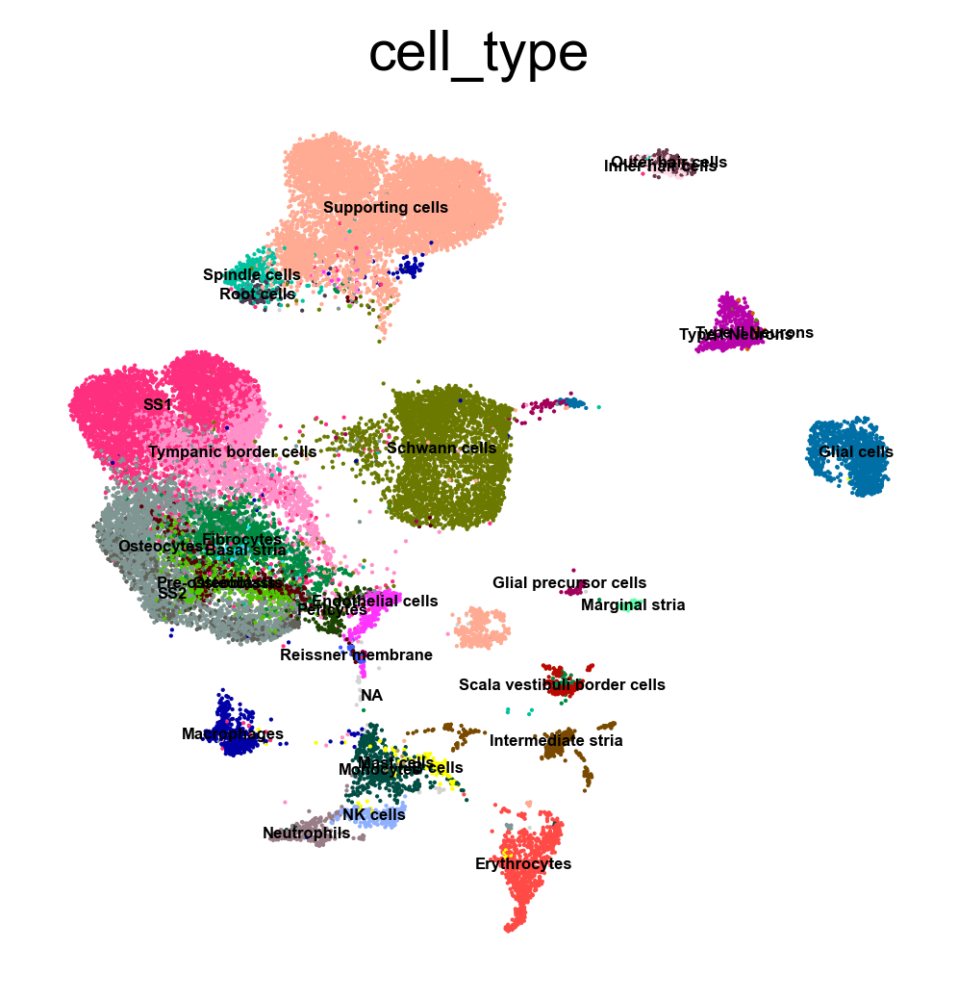

In [32]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4,save="mouse_p8_pnas-2.pdf")

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


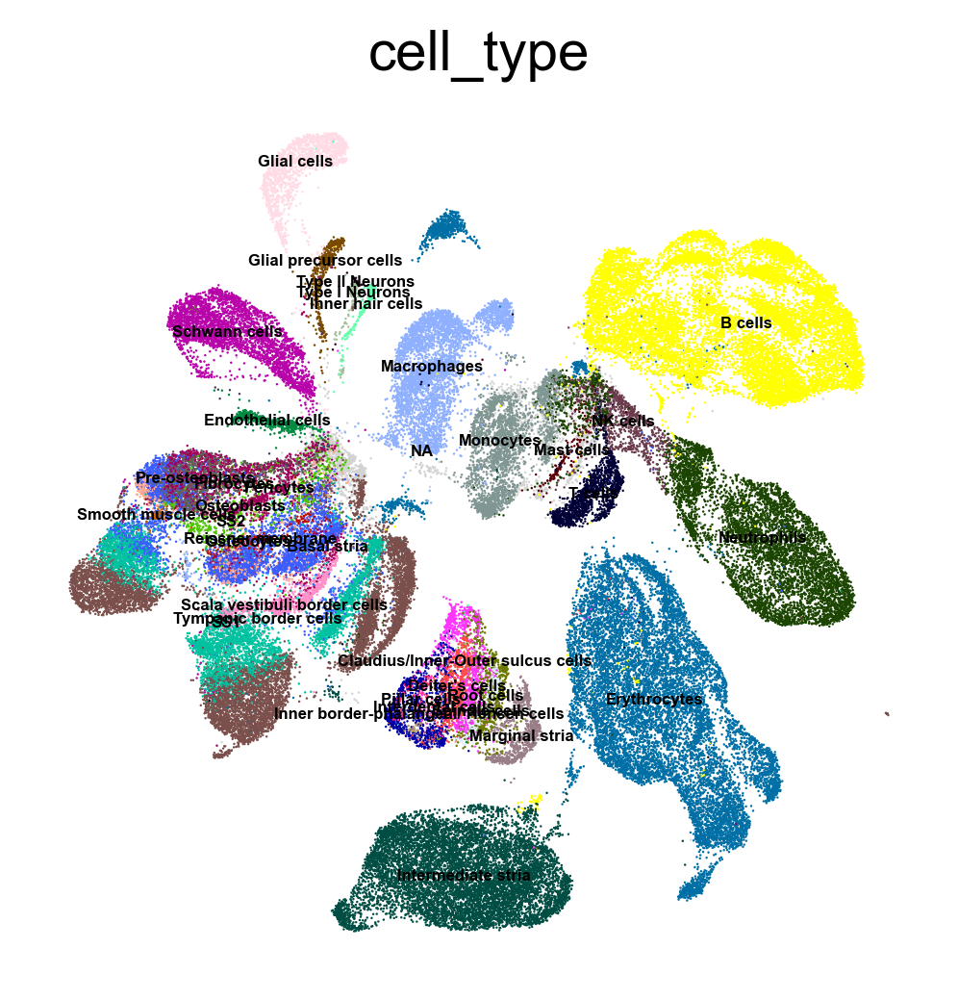

In [17]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


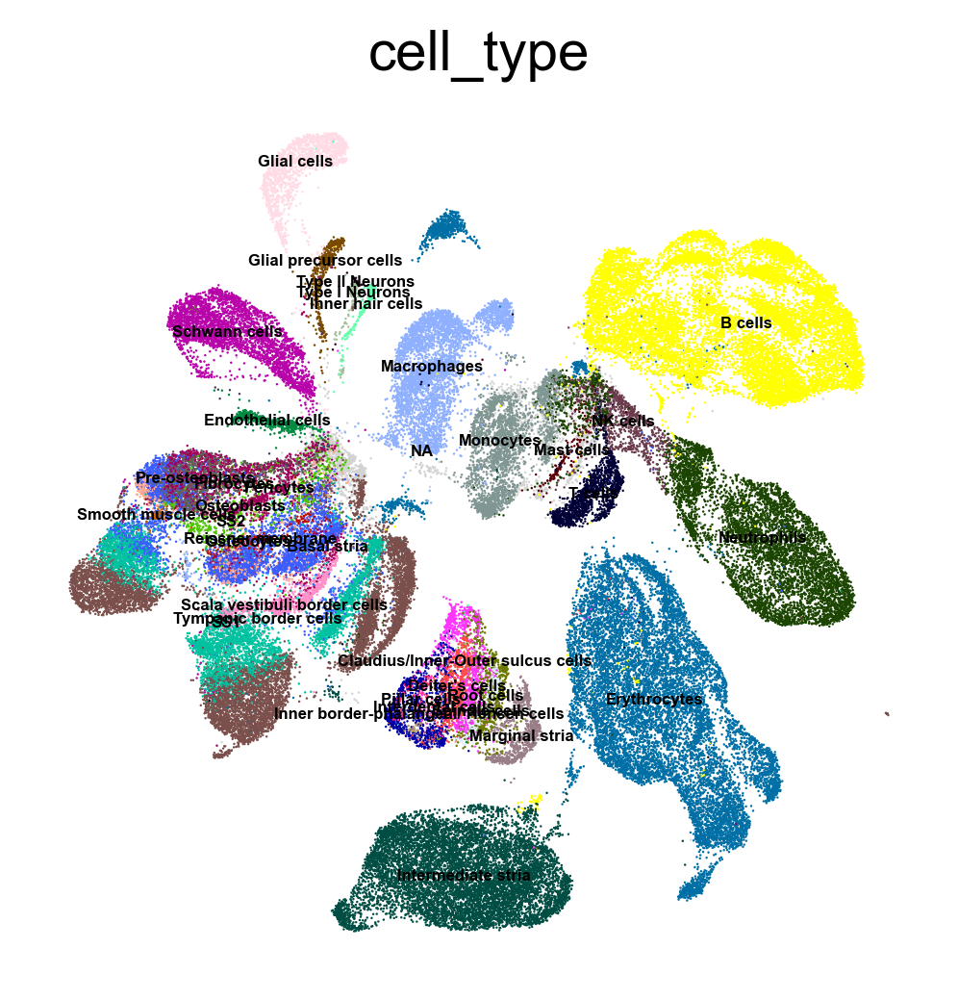

In [34]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4,save="mouse_p8p12p20_pnas-2.pdf")

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


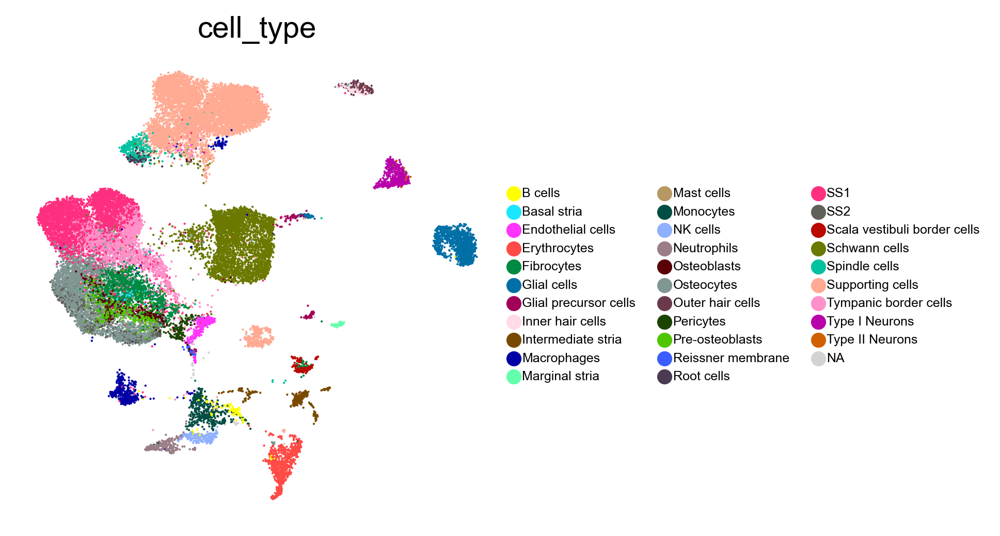

In [35]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata, color=['cell_type'], wspace=0.5,frameon=False, legend_fontsize=6,save="mouse_p8_pnas.pdf")

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


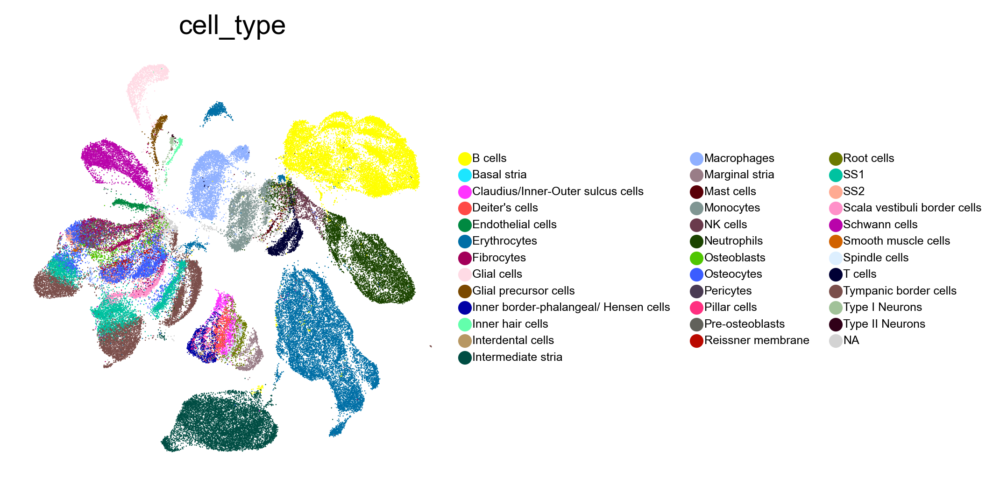

In [36]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2, color=['cell_type'], wspace=0.5,frameon=False, legend_fontsize=6,save="mouse_p8p12p20_pnas.pdf")

In [18]:
marker_genes = [
    *["Otoa"], #INTERDENTAL CELLS
    *["Tmc1","Myo7a","Otof","Slc26a5","Slc17a8"],#HAIR CELLS
    *["Otog","Otogl","Ush1c","Gata3","Lgr5"],# SUPPORTING CELLS
    *["Smpx","Lgr6","Enah","Ngfr","Prox1"],#PILLAR CELLS
    *["Prdm12","Fgfr3"],#PILLAR CELLS, DEITERS' CELLS
    *["Ceacam16","Rbp7","Fabp3","S100a1"],#DEITERS' CELLS
    *["Aqp4","Tectb","Slc1a3","Apoe"],#INNER BOR.-PH./HENSEN'S CELLS
    *["Epyc"],#INNER BOR.-PH./HENSEN'S CELLS; CLAUD./IN.-OUT.SULCUS CELLS 
    *["Emilin2","Notum","Rarres1"], #TYMPANIC BORDER CELLS
    
    *["Snap25","Nefl","Pvalb","Th","Ano2","Tubb3","Gata3","Prph"],#SGN
    *["Olig1","Olig2"], #GLIAL PRECURSOR CELLS
    *["Mag","Mog","Mobp"],#SATELLITE GLIAL CELLS
    *["Mpz","Prx"], #SCHWANN CELLS
    *["Mlana"], #LW
    *["Vwf"], #ENDO.CELLS
    *["Esam"],#ENDO.CELLS
    *["Rgs5","Itga8","Creb5"],#PERICYTES
    *["Tagln"],#SMOOTH MUSCLE CELLS (ALDN1A2)
    *["Kcne1","Esrrb","Dclk1"],#MARGINAL CELLS
    *["Tyr","Dct"],#INTER.STRIA CELLS
    *["Cldn11","Atp6v0a4","Tjp1"],#BASAL STRIA CELLS
    *["Slc26a4","Anxa1"],#SPINDLE CELLS; ROOT CELLS

    
    *["Otos","Col9a2","Col9a3","Atp2b2","Slc13a3","Slc7a11","Slc4a10","Veph1","Chst9","Thsd4"],#FIBROCYTES
    *["Slc12a2","Gjb2"],# FIBROCYTES SUBTYPES I TO V
    *["Dlx5","Bglap","Phex", "Dmp1","Ibsp"], #OSTEOBLASTS
    *["Osr2","Bmp6","Slc7a11"], # SURROUNDING STRUCTURES
    *["Slc26a7"], #RM
    
    *["Rhd"], #ERYTHROCYTES
    *["Ly6g"], #NEUTROPHILS
    *["Cd19"], # B CELLS
    *["Cd3g"], #T CELLS   
    *["Nkg7"],  #NK CELLS
    *["Cd68"], #MONOCYTES
    *["Aif1","Cd163"],#MACROPHAGES 
    *["Prss34"]  #MAST CELLS 

    
]

In [19]:
small_marker_dict={
     'Neutrophils':["Ly6g"],
    'NK Cells':["Nkg7"],
    'Monocytes':["Cd68"],
'Mast Cells':["Prss34"],
    'B Cells':["Cd19"],
    'T Cells':["Cd3g"],
    'Erythrocytes':["Rhd"],
   'Reissner membrane':["Slc26a7"],
    'Smooth Muscle Cells':["Tagln"],
     'Intermediate stria':['Mlana','Tyr','Dct'],
     'Scala vestibuli border cells':['Fxyd2'],
    'Marginal stria':['Kcne1','Esrrb','Dclk1'],
    'Glial Precursor Cells':["Olig1","Olig2"],
    'Glial.cells':['Mag','Mog','Mobp'],
    'Schwann.Cells':['Mpz','Prx'],
 'Osteocytes':['Ccl11'],
     'Fibrocytes':['Slc13a3','Slc7a11','Thsd4','Slc12a2','Bmp6','Slc7a11','Slc26a7'],
 'Surrounding structures':["Osr2","Bmp6","Slc7a11"],
      'Osteoblasts':["Dlx5","Bglap","Phex", "Dmp1","Ibsp"],
     'Basal stria':['Cldn11','Atp6v0a4','Tjp1'],
    'pericytes':['Rgs5','Itga8','Creb5'],
    'Endothelial cells':['Vwf','Esam'],
     'Tympanic border cells':['Emilin2','Notum','Rarres1'],
    'macrophages':['Aif1','Cd163'],
    'Spindle/Root_cells':['Slc26a4','Anxa1'],
    'Pan_Supporting_cells':['Otog','Otogl','Ush1c','Gata3'],
    'Inner_border-phalangeal/Hensen_cells':['S100a1','Slc1a3'],
     'Deiters_cells':['Lgr5','Fgfr3','Prox1','Ceacam16'],
     'Pillar_cells' :['Smpx','Lgr6','Enah'],
      'Interdental_cells':['Otoa'],
     'Claudius/Inner-Outer_sulcus_cells':['Apoe','Epyc'],
     'TypeII_SGN':['Prph','Ano2'],
     'TypeI_SGN' :['Snap25','Nefl','Pvalb','Calb2'],
    'OHC':['Tmc1','Myo7a','Slc26a5','Calb1'],
       'IHC':['Otof','Slc17a8'],
   
    
}
 


In [20]:
small_marker_dict

{'Neutrophils': ['Ly6g'],
 'NK Cells': ['Nkg7'],
 'Monocytes': ['Cd68'],
 'Mast Cells': ['Prss34'],
 'B Cells': ['Cd19'],
 'T Cells': ['Cd3g'],
 'Erythrocytes': ['Rhd'],
 'Reissner membrane': ['Slc26a7'],
 'Smooth Muscle Cells': ['Tagln'],
 'Intermediate stria': ['Mlana', 'Tyr', 'Dct'],
 'Scala vestibuli border cells': ['Fxyd2'],
 'Marginal stria': ['Kcne1', 'Esrrb', 'Dclk1'],
 'Glial Precursor Cells': ['Olig1', 'Olig2'],
 'Glial.cells': ['Mag', 'Mog', 'Mobp'],
 'Schwann.Cells': ['Mpz', 'Prx'],
 'Osteocytes': ['Ccl11'],
 'Fibrocytes': ['Slc13a3',
  'Slc7a11',
  'Thsd4',
  'Slc12a2',
  'Bmp6',
  'Slc7a11',
  'Slc26a7'],
 'Surrounding structures': ['Osr2', 'Bmp6', 'Slc7a11'],
 'Osteoblasts': ['Dlx5', 'Bglap', 'Phex', 'Dmp1', 'Ibsp'],
 'Basal stria': ['Cldn11', 'Atp6v0a4', 'Tjp1'],
 'pericytes': ['Rgs5', 'Itga8', 'Creb5'],
 'Endothelial cells': ['Vwf', 'Esam'],
 'Tympanic border cells': ['Emilin2', 'Notum', 'Rarres1'],
 'macrophages': ['Aif1', 'Cd163'],
 'Spindle/Root_cells': ['Slc26a4', 

In [21]:
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

In [22]:
smarker_genes_in_data

{}

categories: B cells, Basal stria, Endothelial cells, etc.
var_group_labels: Neutrophils, NK Cells, Monocytes, etc.


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


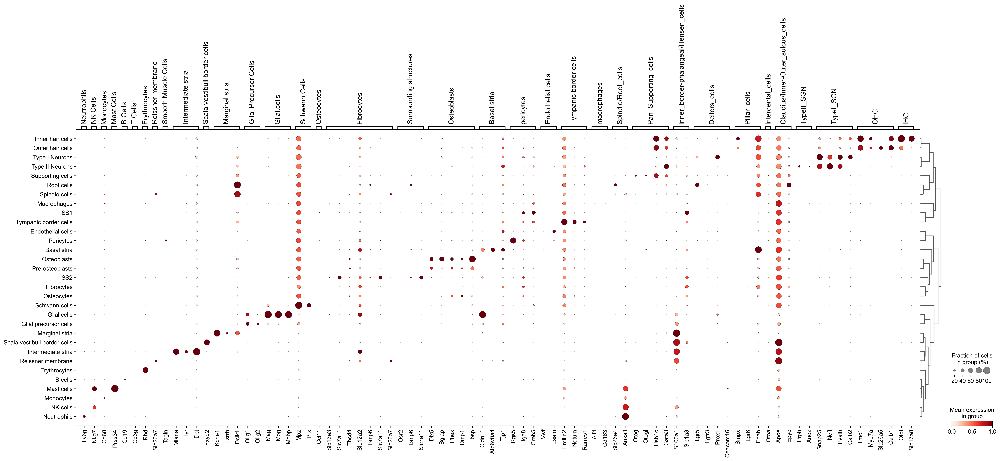

In [23]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(
    adata,gene_symbols='gene_symbol',
    groupby="cell_type",
    var_names=small_marker_dict,
   dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    save="cochlea-cell_type_p8_mouse_pnas.pdf"
)

In [24]:
small_marker_dict={
     'Neutrophils':["Ly6g"],
'Monocytes':["Cd68"],
'macrophages':['Aif1','Cd163'],
'T Cells':["Cd3g"],
    'Mast Cells':["Prss34"],
 'B Cells':["Cd19"],
      'NK Cells':["Nkg7"],
  'Erythrocytes':["Rhd"],
     'Pan_Supporting_cells':['Otog','Otogl','Ush1c','Gata3'],
    'Deiters_cells':['Lgr5','Fgfr3','Prox1','Ceacam16'],
     'Claudius/Inner-Outer_sulcus_cells':['Apoe','Epyc'],
      'Spindle/Root_cells':['Slc26a4','Anxa1'],
 'Pillar_cells' :['Smpx','Lgr6','Enah'],
    'Inner_border-phalangeal/Hensen_cells':['S100a1','Slc1a3'],
  'Interdental_cells':['Otoa'],
     'OHC':['Tmc1','Myo7a','Slc26a5','Calb1'],
       'IHC':['Otof','Slc17a8'],
     'TypeII_SGN':['Prph','Ano2'],
     'TypeI_SGN' :['Snap25','Nefl','Pvalb','Calb2'],
    'Glial Precursor Cells':["Olig1","Olig2"],
    'Glial.cells':['Mag','Mog','Mobp'],
    'Schwann.Cells':['Mpz','Prx'],
      'Scala vestibuli border cells':['Fxyd2'],
     'Basal stria':['Cldn11','Atp6v0a4','Tjp1'],
     'Intermediate stria':['Mlana','Tyr','Dct'],
    'Marginal stria':['Kcne1','Esrrb','Dclk1'],
    
     'Fibrocytes':['Slc13a3','Slc7a11','Thsd4','Slc12a2','Bmp6','Slc7a11','Slc26a7'],
    'Surrounding structures':["Osr2","Bmp6","Slc7a11"],
     'Osteocytes':['Ccl11'],
    'Reissner membrane':["Slc26a7"],
     'pericytes':['Rgs5','Itga8','Creb5'],
    'Osteoblasts':["Dlx5","Bglap","Phex", "Dmp1","Ibsp"],
     'Tympanic border cells':['Emilin2','Notum','Rarres1'],
    'Smooth Muscle Cells':["Tagln"],
       'Endothelial cells':['Vwf','Esam'],
 'gene_to_plot':['Duoxa2'],#'Zfpm1', 'Tshz3', 'Rxrg', 'Foxo4', 'Kcnb2', 'Chrna10','Rxra','Rxrb'
    
}

categories: B cells, Basal stria, Claudius/Inner-Outer sulcus cells, etc.
var_group_labels: Neutrophils, Monocytes, macrophages, etc.


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


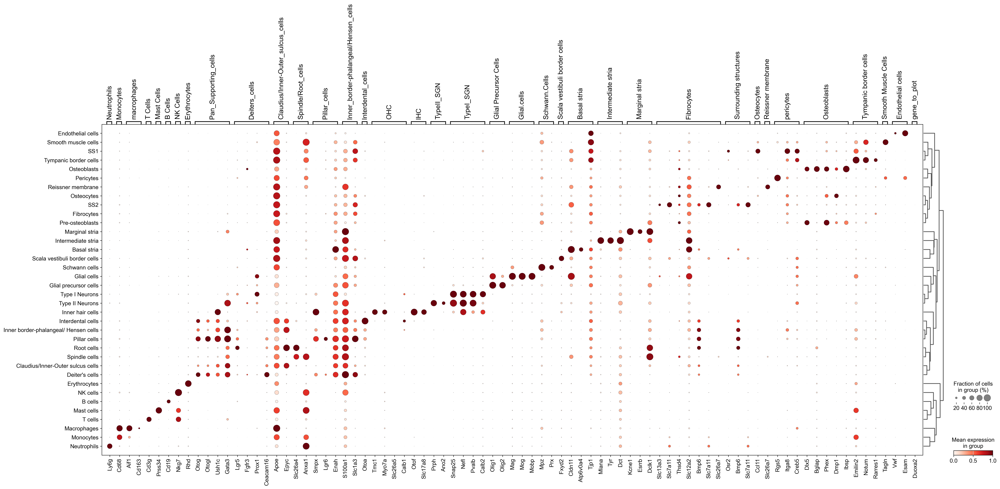

In [25]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(
    adata2,gene_symbols='gene_symbol',
    groupby="cell_type",
    var_names=small_marker_dict,
   dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    save="cochlea-cell_type_p8p12p20_mouse_pnas_add_new2.pdf"
)

categories: B cells, Basal stria, Endothelial cells, etc.
var_group_labels: Neutrophils, Monocytes, macrophages, etc.


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


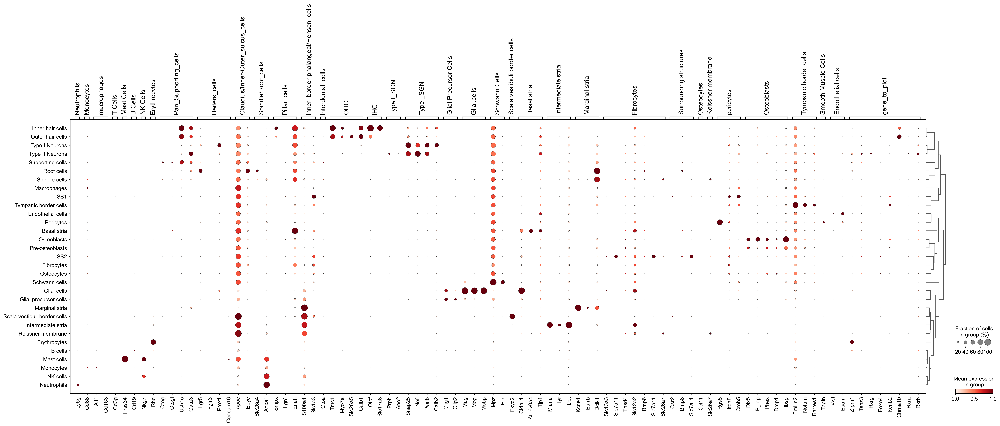

In [43]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(
    adata,gene_symbols='gene_symbol',
    groupby="cell_type",
    var_names=small_marker_dict,
   dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    save="cochlea-cell_type_p8_mouse_pnas_add_new.pdf"
)

categories: B cells, Basal stria, Claudius/Inner-Outer sulcus cells, etc.
var_group_labels: Neutrophils, Monocytes, macrophages, etc.


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


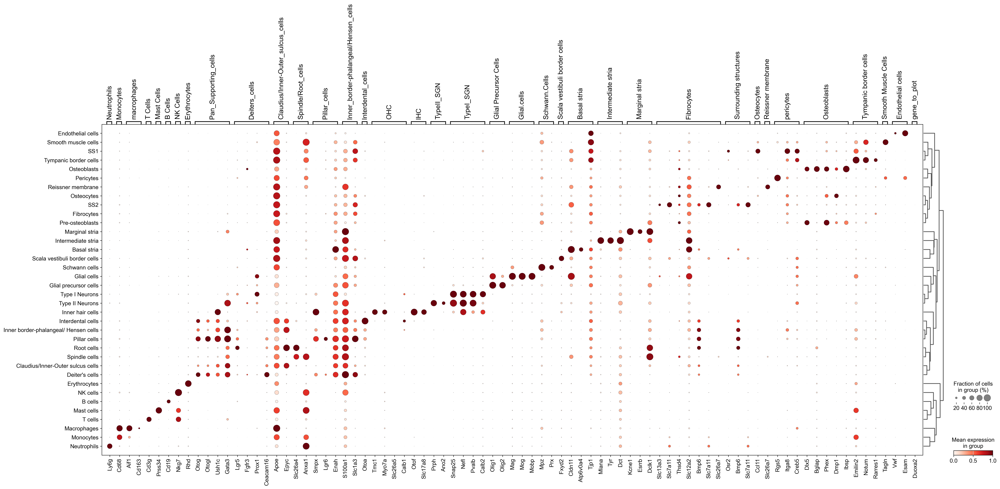

In [26]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(
    adata2,gene_symbols='gene_symbol',
    groupby="cell_type",
    var_names=small_marker_dict,
   dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    save="cochlea-cell_type_p8p12p20_mouse_pnas.pdf"
)

In [29]:
marker_genes =['Tubb3','Snap25','Nefl','Kcnip4','Gata3','Prph','Th']

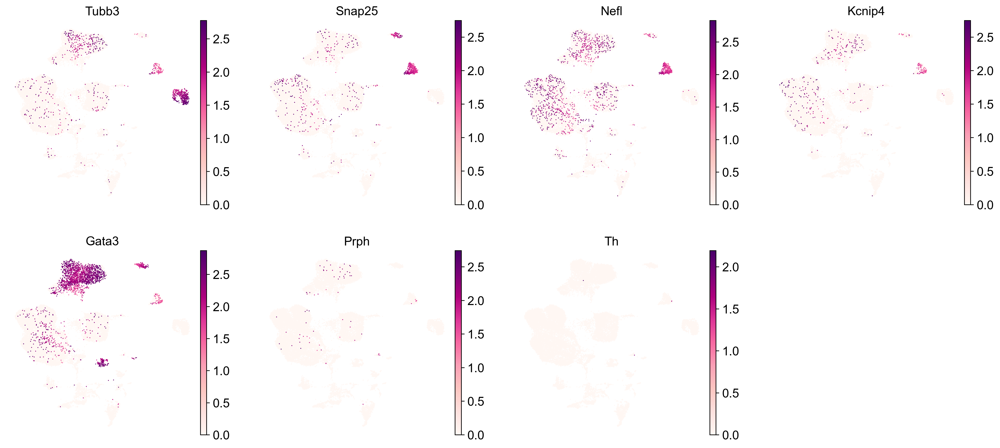

In [31]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata,gene_symbols='gene_symbol',
           color=marker_genes,save="cochlea-cell_type_mouse_p8_pnas_kcnip4.pdf"
          )

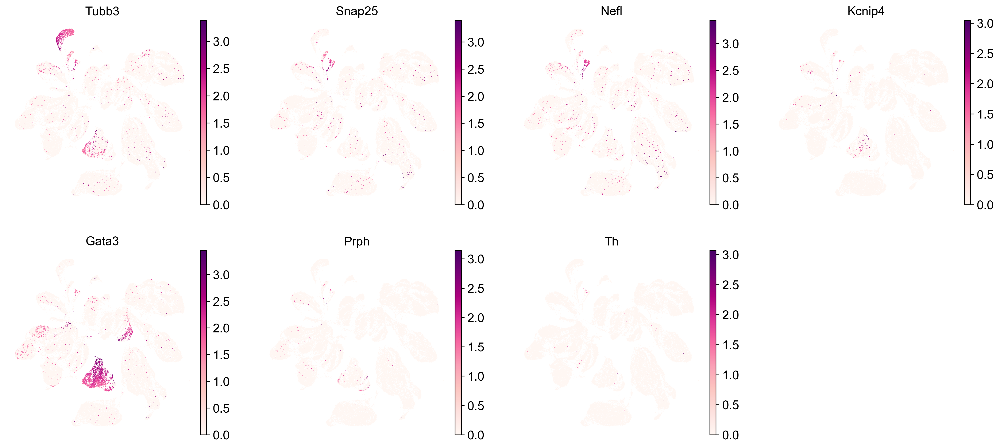

In [32]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2,gene_symbols='gene_symbol',
           color=marker_genes,save="cochlea-cell_type_mouse_p8p12p20_pnas_kcnip4.pdf"
          )

In [34]:
adata2

AnnData object with n_obs × n_vars = 88006 × 39970
    obs: 'cell_type', 'age', 'louvain', 'leiden'
    var: 'gene_symbol'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [35]:
adata2.obs['age']

observations
AAACGCTAGCGAAACC_CA08_S1    P12
AAGCGTTAGGAATCGC_CA08_S1    P12
AATTTCCAGGGCCTCT_CA08_S1    P12
ACGTAACAGACTAGAT_CA08_S1    P12
ACTTTCATCATTTGGG_CA08_S1    P12
                           ... 
TTCTCTCAGAGTAACT_CP2_S2      P8
TTCTCTCTCCGTCCTA_CP2_S2      P8
TTGAACGGTAGACACG_CP2_S2      P8
TTTACCAGTCTAGTGT_CP2_S2      P8
TTTCAGTAGCGTCGAA_CP2_S2      P8
Name: age, Length: 88006, dtype: category
Categories (3, object): ['P8', 'P12', 'P20']

In [40]:
adata2_P8 = adata2[adata2.obs['age']=='P8']
adata2_P8
adata2_P12 = adata2[adata2.obs['age']=='P12']
adata2_P12
adata2_P20 = adata2[adata2.obs['age']=='P20']
adata2_P20

View of AnnData object with n_obs × n_vars = 26169 × 39970
    obs: 'cell_type', 'age', 'louvain', 'leiden'
    var: 'gene_symbol'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

View of AnnData object with n_obs × n_vars = 22827 × 39970
    obs: 'cell_type', 'age', 'louvain', 'leiden'
    var: 'gene_symbol'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

View of AnnData object with n_obs × n_vars = 39010 × 39970
    obs: 'cell_type', 'age', 'louvain', 'leiden'
    var: 'gene_symbol'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
sc.pp.normalize_total(adata2_P8)
sc.pp.log1p(adata2_P8)
sc.tl.pca(adata2_P8,svd_solver='arpack')
sc.pp.neighbors(adata2_P8,n_neighbors=50,n_pcs=30,metric="cosine")
sc.tl.umap(adata2_P8)
sc.tl.leiden(adata2_P8)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


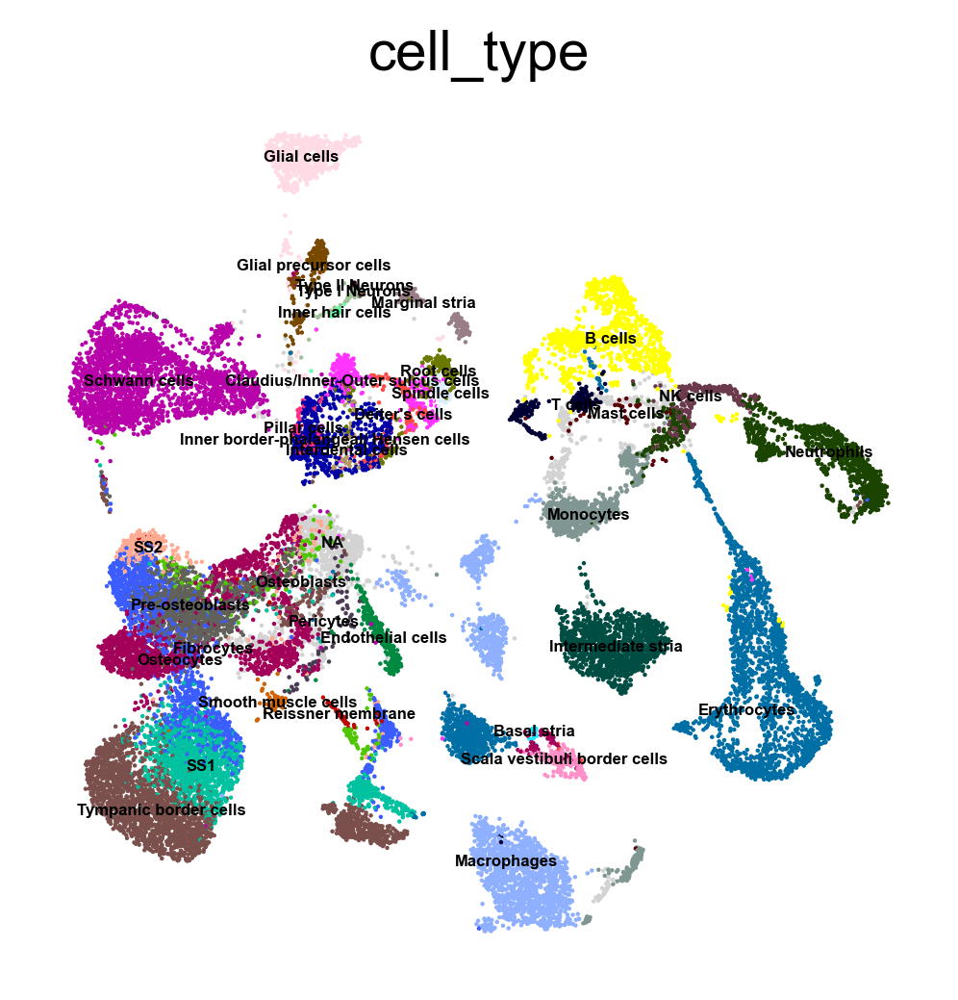

In [42]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2_P8,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4,save="mouse_p8_pnas_subset.pdf")

In [43]:
sc.pp.normalize_total(adata2_P12)
sc.pp.log1p(adata2_P12)
sc.tl.pca(adata2_P12,svd_solver='arpack')
sc.pp.neighbors(adata2_P12,n_neighbors=50,n_pcs=30,metric="cosine")
sc.tl.umap(adata2_P12)
sc.tl.leiden(adata2_P12)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [44]:
sc.pp.normalize_total(adata2_P20)
sc.pp.log1p(adata2_P20)
sc.tl.pca(adata2_P20,svd_solver='arpack')
sc.pp.neighbors(adata2_P20,n_neighbors=50,n_pcs=30,metric="cosine")
sc.tl.umap(adata2_P20)
sc.tl.leiden(adata2_P20)

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


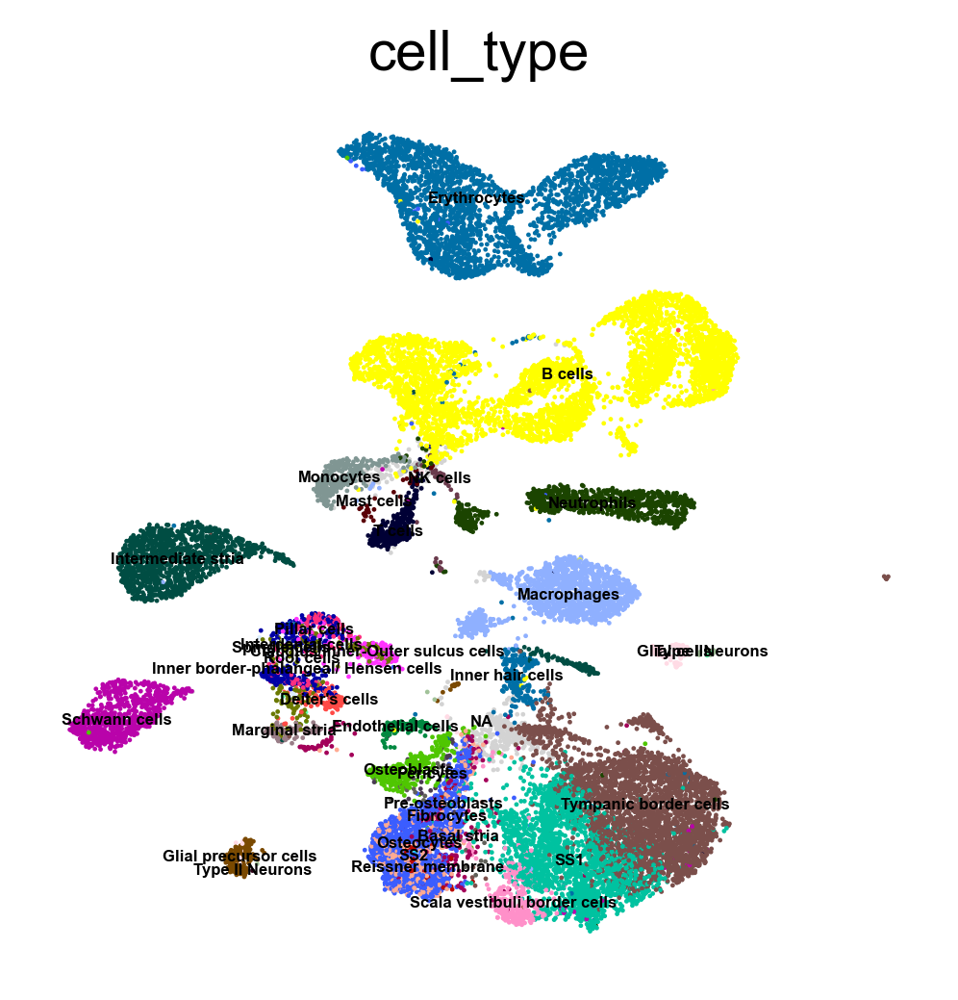

In [45]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2_P12,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4,save="mouse_p12_pnas_subset.pdf")

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


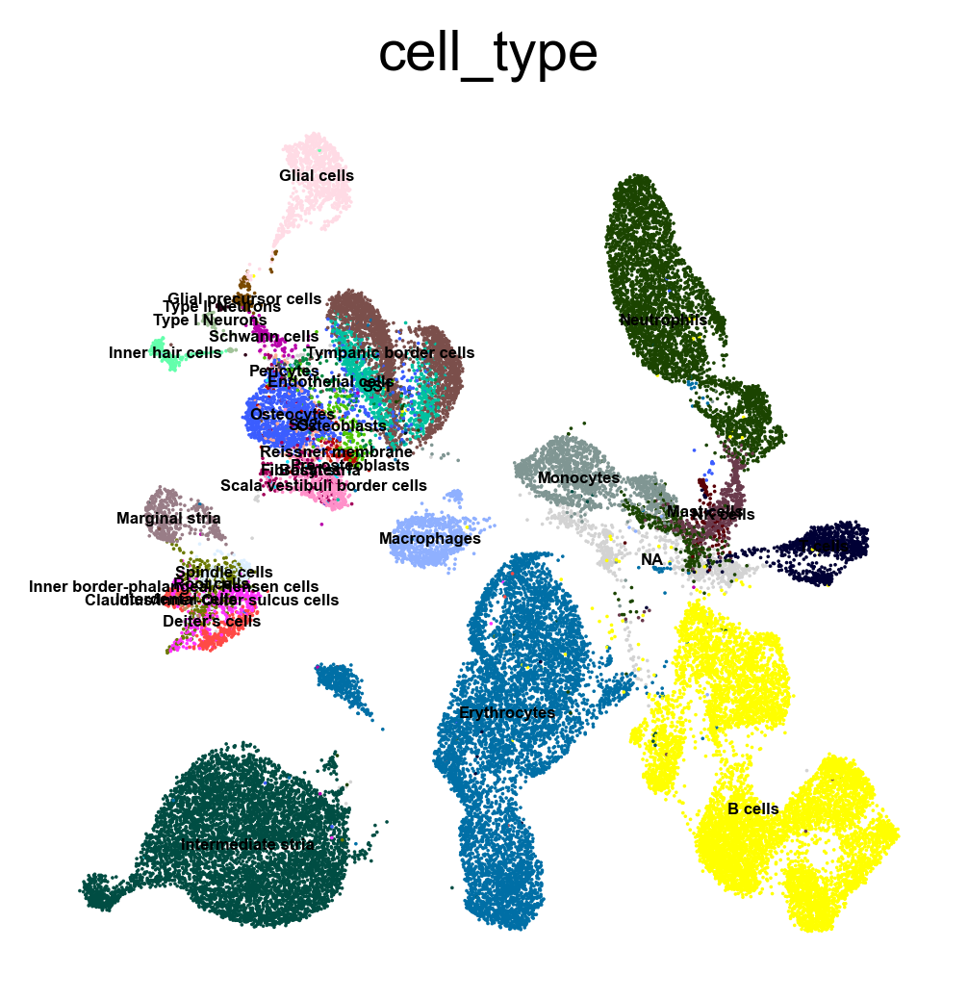

In [46]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata2_P20,color=["cell_type"],legend_loc="on data",frameon=False, legend_fontsize=4,save="mouse_p20_pnas_subset.pdf")

In [52]:
adata.write('pnas_snRNA_P8.h5ad')

In [53]:
adata2.write('pnas_scRNA_P8P12P20.h5ad')

In [54]:
adata2_P8.write('pnas_scRNA_P8.h5ad')

In [55]:
adata2_P12.write('pnas_scRNA_P12.h5ad')

In [56]:
adata2_P20.write('pnas_scRNA_P20.h5ad')